<a href="https://colab.research.google.com/github/nakul-c/LULC_Prediction/blob/main/2022_LULC_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install rasterio
!pip install geopandas
!pip install xgboost
!pip install pyproj

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 37.5 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import rasterio
from rasterio.plot import show
import xgboost as xgb
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import cm
from matplotlib.colors import ListedColormap
import pandas as pd
import seaborn as sns
import geopandas as gpd
import pyproj

In [ ]:
path_img = '/content/drive/MyDrive/2022_classification/2022_sentinel_2.tif'


In [ ]:
src = rasterio.open(path_img)

In [ ]:
img = src.read()

In [ ]:
img = img[:, ~np.isnan(img).any(axis=0)]
num_columns = 12

size_of_third_dimension = 5000
img = img.reshape(-1, num_columns, size_of_third_dimension)

img

array([], shape=(0, 12, 5000), dtype=float64)

In [ ]:
img.shape

(0, 12, 5000)

In [ ]:
img = img.transpose([1,2,0])


In [ ]:
red = img[: , : , 3]
green = img[: , : , 2]
blue = img[: , : , 1]
rgb = np.dstack((red , green , blue))

(-0.5, 4999.5, 4693.5, -0.5)

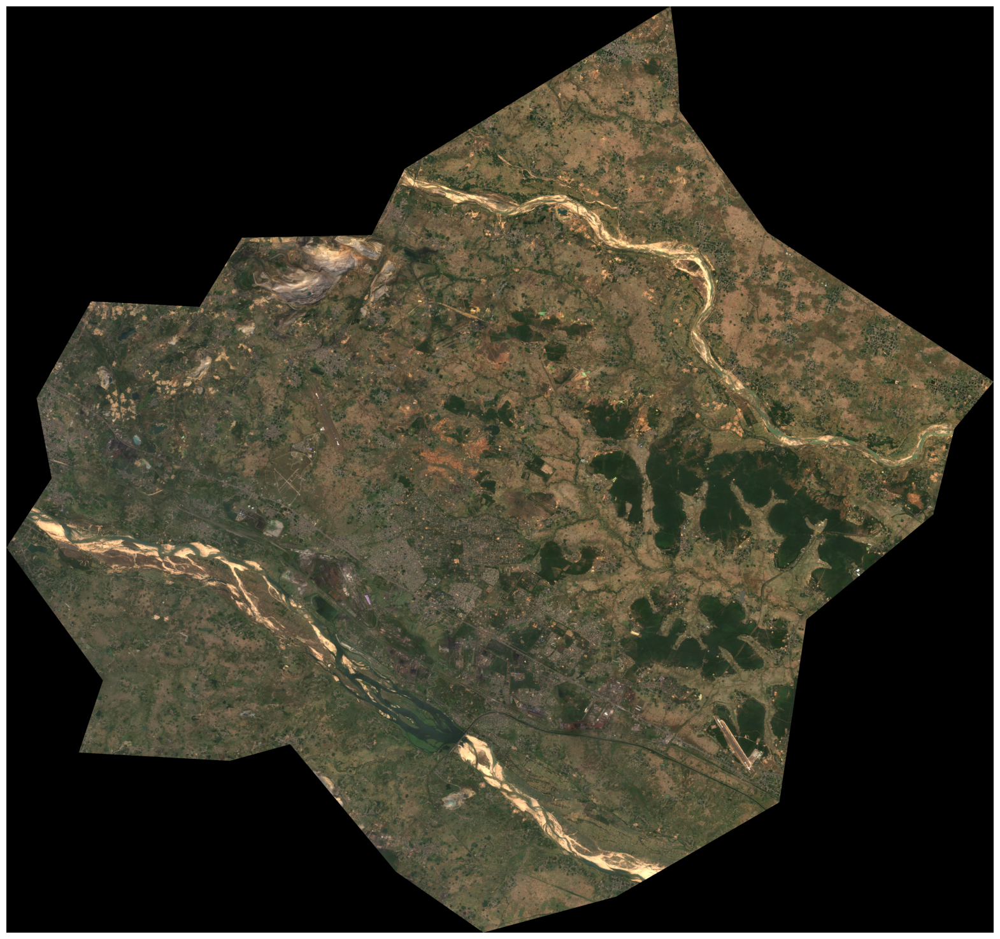

In [ ]:
plt.figure(figsize = [20,20])
plt.imshow(rgb*4)
plt.axis('off')

In [ ]:
samples = gpd.read_file('/content/drive/MyDrive/2022_classification/New_2018.shp')

In [ ]:
samples

,Class,LULC_Point,LULC_Poi_1,LULC_Poi_2,LULC_Poi_3,LULC_Poi_4,LULC_Poi_5,LULC_Poi_6,LULC_Poi_7,LULC_Poi_8,LULC_Poi_9,LULC_Poi10,LULC_Poi11,LULC_Poi12,LULC_Poi13,geometry
0,1,0.0864,0.08605,0.0943,0.08575,0.1162,0.18185,0.20335,0.20895,0.2125,0.23105,0.17525,0.11495,test,BuildUp,POINT (87.28225 23.54839)
1,1,0.0864,0.08605,0.0943,0.08575,0.1162,0.18185,0.20335,0.20895,0.2125,0.23105,0.17525,0.11495,test,BuildUp,POINT (87.30448 23.54446)
2,1,0.0864,0.08605,0.0943,0.08575,0.1162,0.18185,0.20335,0.20895,0.2125,0.23105,0.17525,0.11495,test,BuildUp,POINT (87.28972 23.53470)
3,1,0.0864,0.08605,0.0943,0.08575,0.1162,0.18185,0.20335,0.20895,0.2125,0.23105,0.17525,0.11495,test,BuildUp,POINT (87.31736 23.55067)
4,1,0.0864,0.08605,0.0943,0.08575,0.1162,0.18185,0.20335,0.20895,0.2125,0.23105,0.17525,0.11495,test,BuildUp,POINT (87.33204 23.54320)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
270,7,0.0955,0.10075,0.1172,0.12845,0.1532,0.18025,0.19485,0.2099,0.20355,0.1998,0.2538,0.2017,test,Road,POINT (87.46536 23.62472)
271,7,0.0955,0.10075,0.1172,0.12845,0.1532,0.18025,0.19485,0.2099,0.20355,0.1998,0.2538,0.2017,test,Road,POINT (87.46531 23.62463)
272,7,0.0955,0.10075,0.1172,0.12845,0.1532,0.18025,0.19485,0.2099,0.20355,0.1998,0.2538,0.2017,test,Road,POINT (87.46524 23.62437)
273,7,0.0955,0.10075,0.1172,0.12845,0.1532,0.18025,0.19485,0.2099,0.20355,0.1998,0.2538,0.2017,test,Road,POINT (87.46493 23.62406)


In [ ]:
samples = samples.to_crs('EPSG:4326')
print(samples.crs)

EPSG:4326


In [ ]:
cmap = ListedColormap([  '#c92a0d' , '#00ffff' , '#98ff00' , '#e76cdc' , '#ffc82d' , '#887e27' , '#cbc4d6'])

<Axes: >

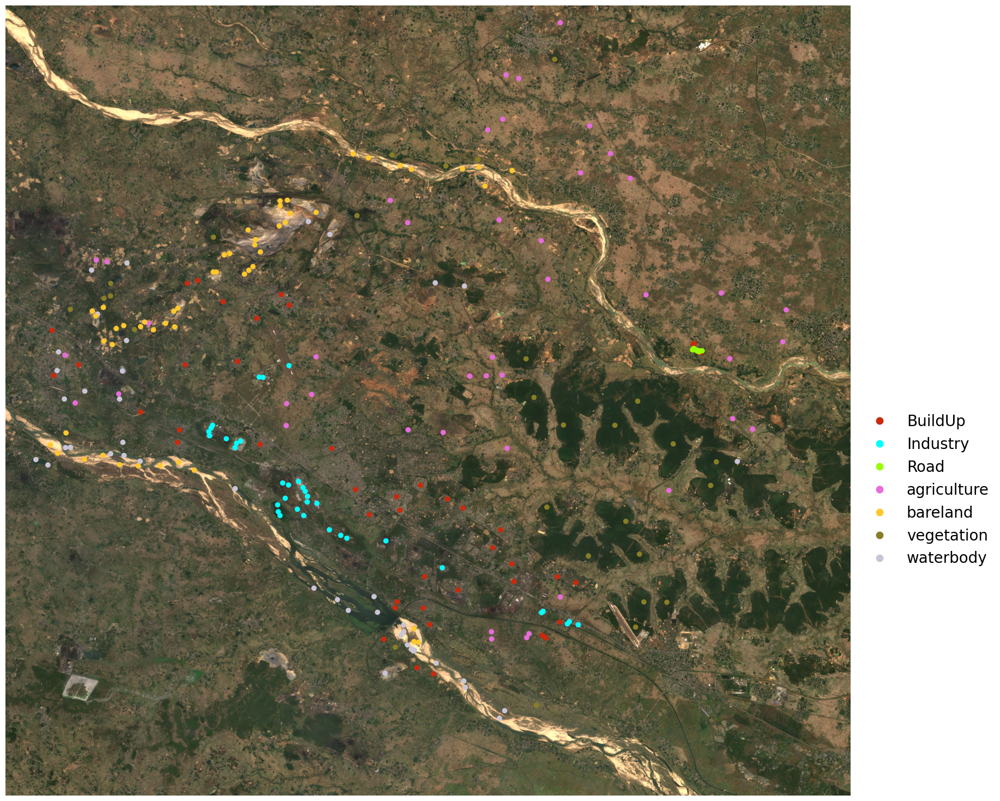

In [ ]:
fig, ax = plt.subplots(figsize=(20, 20))
samples.plot(column='LULC_Poi13', categorical=True, cmap=cmap, legend=True, legend_kwds={'bbox_to_anchor': (1, 0.5), 'loc': 'upper left', 'fontsize': 20, 'frameon': False}, ax=ax)
ax.axis('off')
show(rgb.transpose([2, 0, 1]) * 4, transform=src.transform, ax=ax)

In [ ]:
samples['geometry']

0      POINT (87.28225 23.54839)
1      POINT (87.30448 23.54446)
2      POINT (87.28972 23.53470)
3      POINT (87.31736 23.55067)
4      POINT (87.33204 23.54320)
                 ...            
270    POINT (87.46536 23.62472)
271    POINT (87.46531 23.62463)
272    POINT (87.46524 23.62437)
273    POINT (87.46493 23.62406)
274    POINT (87.46459 23.62399)
Name: geometry, Length: 275, dtype: geometry

In [ ]:
import numpy as np

# Read all bands at once
src_array = np.stack([src.read(i+1) for i in range(src.count)], axis=0)

array_samples = []
for point in samples['geometry']:
  x = point.xy[0][0]
  y = point.xy[1][0]
  row, col = src.index(x, y)
  band_values = src_array[:, row, col]
  array_samples.append(band_values)

In [ ]:
X = np.array(array_samples)
X.shape

(275, 12)

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, cohen_kappa_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder

In [ ]:
Y = samples['LULC_Poi13'].values

In [ ]:
labelencoder = LabelEncoder()
Y = labelencoder.fit_transform(Y)

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(X,Y , test_size = 0.3 , random_state = 42)
clf = xgb.XGBClassifier(objective = "multi:softprob" , random_state = 42 , verbosity = 3 ,n_estimators = 500 , max_depth = 10 , n_thread = 8, n_jobs = 8 , learning_rate = 0.01)
clf.fit(x_train , y_train)

[11:00:18] ======== Monitor (0): HostSketchContainer ========
[11:00:18] AllReduce: 0.000215s, 1 calls @ 215us

[11:00:18] MakeCuts: 0.000452s, 1 calls @ 452us

[11:00:18] DEBUG: /workspace/src/gbm/gbtree.cc:130: Using tree method: 0


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [11:00:18] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:00:30] ======== Monitor (0): Learner ========
[11:00:30] Configure: 0.009892s, 1 calls @ 9892us

[11:00:30] EvalOneIter: 0.006872s, 500 calls @ 6872us

[11:00:30] GetGradient: 0.075494s, 500 calls @ 75494us

[11:00:30] PredictRaw: 0.000814s, 500 calls @ 814us

[11:00:30] UpdateOneIter: 11.9582s, 500 calls @ 11958249us

[11:00:30] ======== Monitor (0): GBTree ========
[11:00:30] BoostNewTrees: 11.8669s, 500 calls @ 11866923us

[11:00:30] CommitModel: 0.000836s, 500 calls @ 836us

[11:00:30] ======== Monitor (0): HistUpdater ========
[11:00:30] BuildHistogram: 4.21258s, 19290 calls @ 4212582us

[11:00:30] EvaluateSplits: 3.19326s, 22790 calls @ 3193262us

[11:00:30] InitData: 0.284498s, 3500 calls @ 284498us

[11:00:30] InitRoot: 1.21792s, 3500 calls @ 1217917us

[11:00:30] LeafPartition: 0.00122s, 3500 calls @ 1220us

[11:00:30] UpdatePosition: 2.78406s, 19405 calls @ 2784057us

[11:00:30] UpdatePredictionCache: 0.255803s, 3500 calls @ 255803us

[11:00:30] UpdateTree: 11.3377s, 3500

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=500, n_jobs=8, n_thread=8,
              num_parallel_tree=None, ...)

In [ ]:
print("Accuracy on training set: {:.2f}".format(clf.score(x_train, y_train)))
print("Accuracy on test set: {:.2f}".format(clf.score(x_test, y_test)))

[11:00:30] DEBUG: /workspace/src/gbm/gbtree.cc:130: Using tree method: 0
Accuracy on training set: 0.99
Accuracy on test set: 0.61


In [ ]:
y_predict = clf.predict(x_test)
print(classification_report(y_test , y_predict))

              precision    recall  f1-score   support

           0       0.69      0.69      0.69        16
           1       0.62      0.45      0.53        11
           2       1.00      0.29      0.44         7
           3       0.39      0.64      0.48        11
           4       0.55      0.80      0.65        15
           5       0.71      0.62      0.67         8
           6       0.90      0.60      0.72        15

    accuracy                           0.61        83
   macro avg       0.69      0.58      0.60        83
weighted avg       0.68      0.61      0.62        83



In [ ]:
c_matrix = confusion_matrix(y_test , y_predict)

In [ ]:
names = ['BuildUp' , 'waterbody' , 'vegetation'  , 'Industry' , 'agriculture' , 'bareland' , 'Road']

Text(0.5, 58.7222222222222, 'Predict')

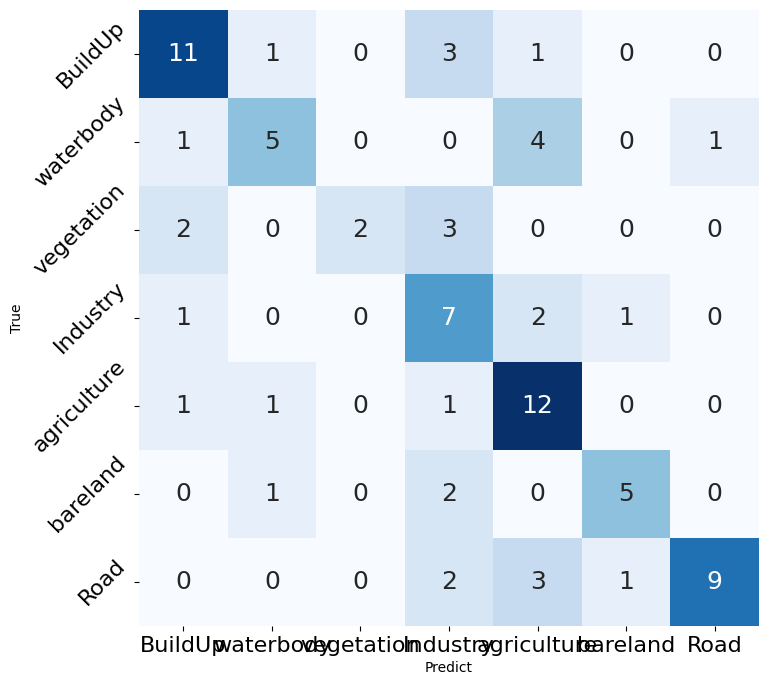

In [ ]:
r1 = pd.DataFrame(data = c_matrix , index = names , columns = names)
fig, ax = plt.subplots(figsize = (8,8))
ax = sns.heatmap(r1 , annot = True , annot_kws ={"size": 18}, fmt = 'd' , cmap = "Blues" , cbar = False)
ax.tick_params(labelsize = 16)
ax.set_yticklabels(names, rotation=45)
ax.set_ylabel('True')
ax.set_xlabel('Predict')

In [ ]:
Predict_img = np.nan_to_num(img)
Predict_img.shape

(4764, 5092, 12)

In [ ]:
Predict_img = Predict_img.reshape(img.shape[0]*img.shape[1] , img.shape[2])
array_pred = clf.predict(Predict_img)
array_pred = array_pred.reshape(img.shape[0] , img.shape[1])

(-0.5, 5091.5, 4763.5, -0.5)

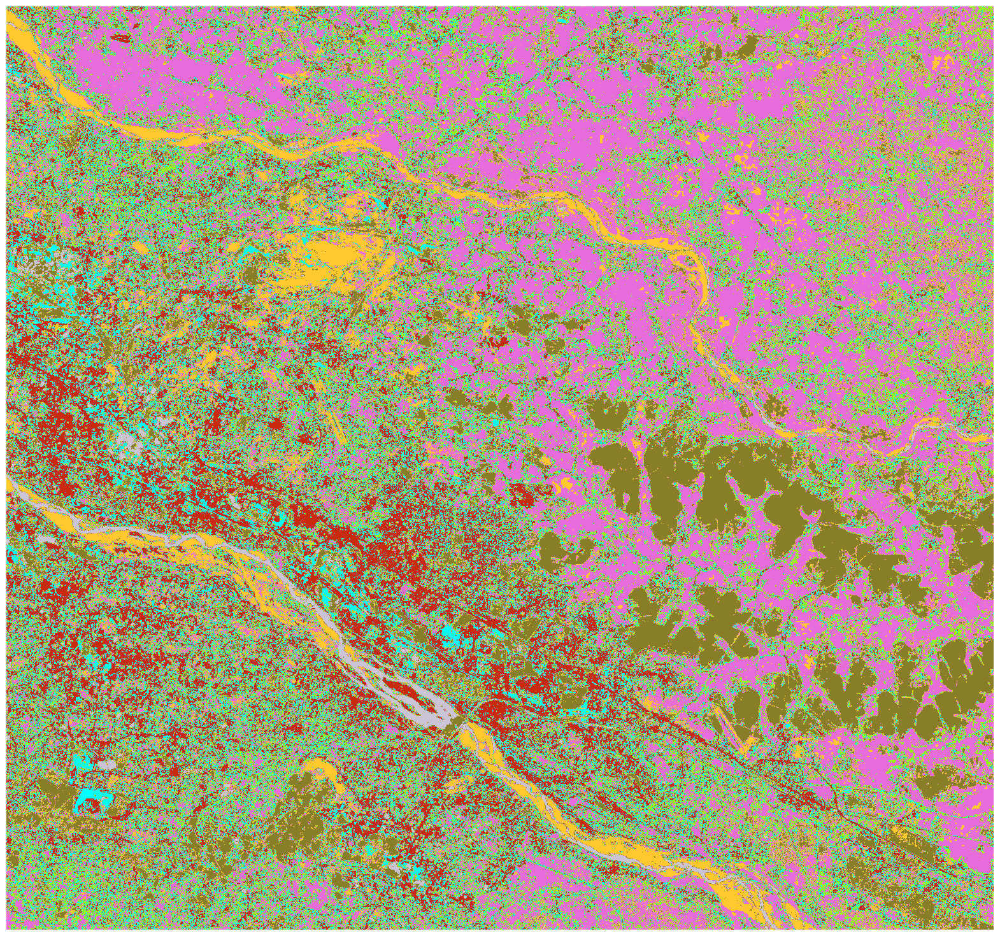

In [ ]:
plt.figure(figsize = [20,20])
plt.imshow(array_pred , cmap = cmap)
plt.axis('off')

In [ ]:
classes, quantity = np.unique(array_pred , return_counts = True)

In [ ]:
areas = quantity*400/1000000
data_stack = np.stack((classes, quantity, areas , names))
df_data = pd.DataFrame(data = data_stack.T , columns = ['Codes' , 'Qtd' , 'Area sq.km' , 'Classes'])
df_data['Area sq.km'] = df_data['Area sq.km'].astype(np.float)
df_data

<ipython-input-40-97cd7ea88817>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  df_data['Area sq.km'] = df_data['Area sq.km'].astype(np.float)


,Codes,Qtd,Area sq.km,Classes
0,0,5657847,2263.1388,BuildUp
1,1,2101794,840.7176,waterbody
2,2,1427834,571.1336,vegetation
3,3,8900338,3560.1352,Industry
4,4,1874923,749.9692,agriculture
5,5,3638614,1455.4456,bareland
6,6,656938,262.7752,Road


<ipython-input-41-c24d29593d13>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax1 = sns.barplot(x = 'Classes' , y = 'Area sq.km' , data = df_data , palette = cmap.colors)


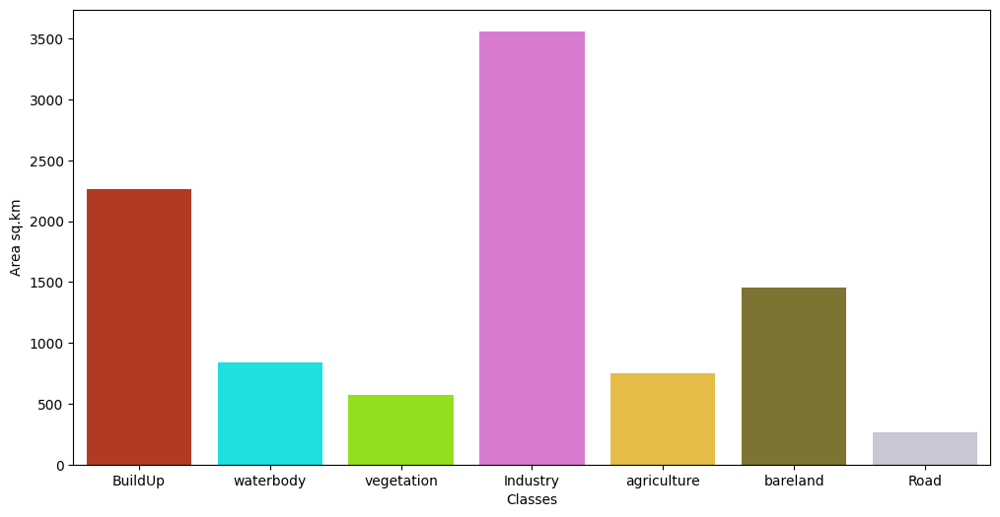

In [ ]:
fig , ax1 = plt.subplots(figsize = (12,6))
ax1 = sns.barplot(x = 'Classes' , y = 'Area sq.km' , data = df_data , palette = cmap.colors)

In [ ]:
from PIL import Image

In [ ]:
png_image = Image.open('/content/drive/MyDrive/2022_classification.png')
png_image.save("/content/2022_classification_colab.tiff" , format = "TIFF")